Clustering analysis of metacell approach
----
Redo the clustering on metacells defined on the scGlue embedding. 

# Preliminaries

## Dependecy notebooks

## Import packages

If you want modules to be automatically reloaded when you call them, use `autoreload`:

In [1]:
%load_ext autoreload
%autoreload 2

Import packages

In [2]:
import anndata
import scanpy as sc
import os
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import cellrank as cr
import scvelo as scv

In [3]:
scv.set_figure_params()
sc.settings.set_figure_params(dpi=100, facecolor='white', frameon=False)

In [4]:
from utils import *

In [5]:
my_cmap = get_continuous_cmap(['D6D6D6', '5D4FF4'])

## Print package versions for reproducibility

If you want to exactly reproduce the results shown here, please make sure that your package versions match what is printed below. 

In [6]:
cr.logging.print_versions()

cellrank==1.5.1 scanpy==1.9.1 anndata==0.8.0 numpy==1.22.4 numba==0.55.2 scipy==1.9.0 pandas==1.5.2 pygpcca==1.0.3 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.11 scvelo==0.2.4 pygam==0.8.0 matplotlib==3.5.2 seaborn==0.11.2


In [7]:
cr.logging.print_version_and_date()

Running CellRank 1.5.1, on 2022-11-27 16:02.


## Setup paths

In [8]:
data_path = '/lustre/groups/ml01/workspace/laura.martens/moretti_colab'
save_path = os.path.join(data_path, 'scglue')
fig_path = '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/panels/all'
sc.settings.figdir = fig_path

# Clustering and marker genes

In [9]:
adata = sc.read('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/metacells.h5ad')

In [10]:
adata.uns['log1p']['base'] = None

## Embedding on metacells

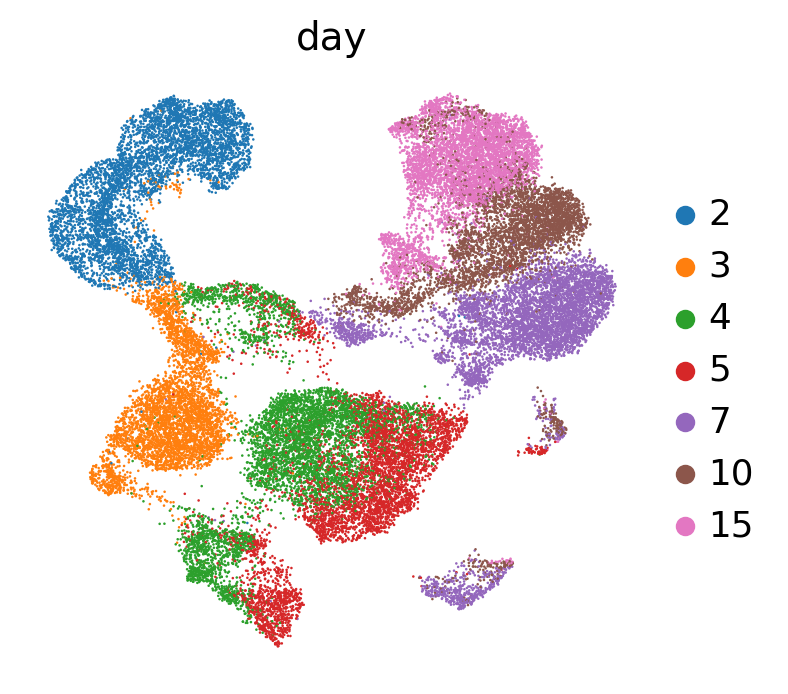

In [11]:
sc.pl.umap(adata, color='day', save='all_cells_day.pdf')

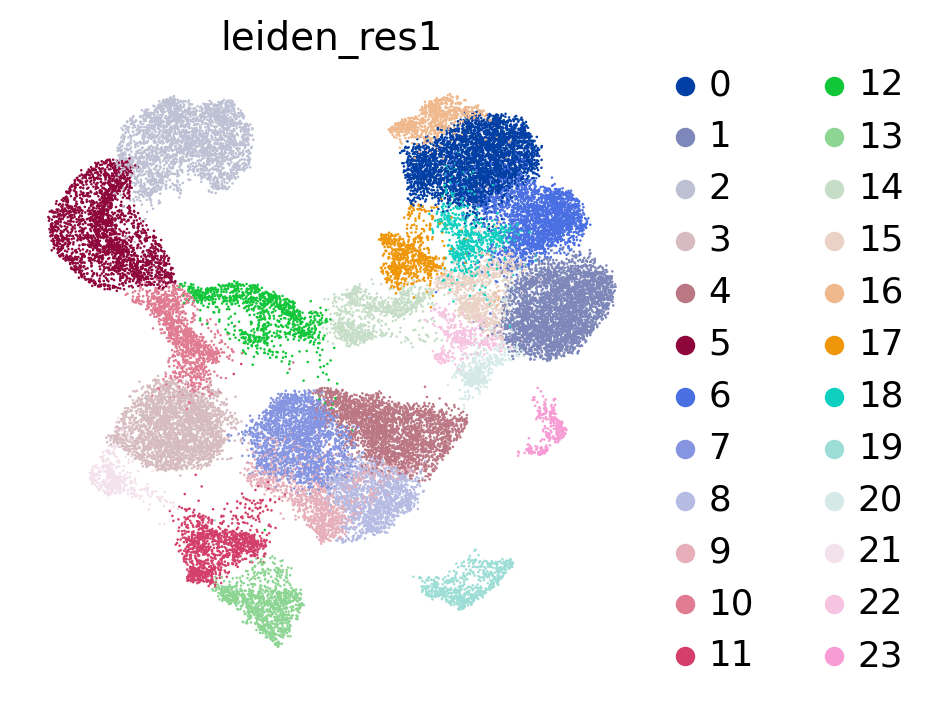

In [11]:
sc.pl.umap(adata, color='leiden_res1', save='all_cells_clusters.pdf')

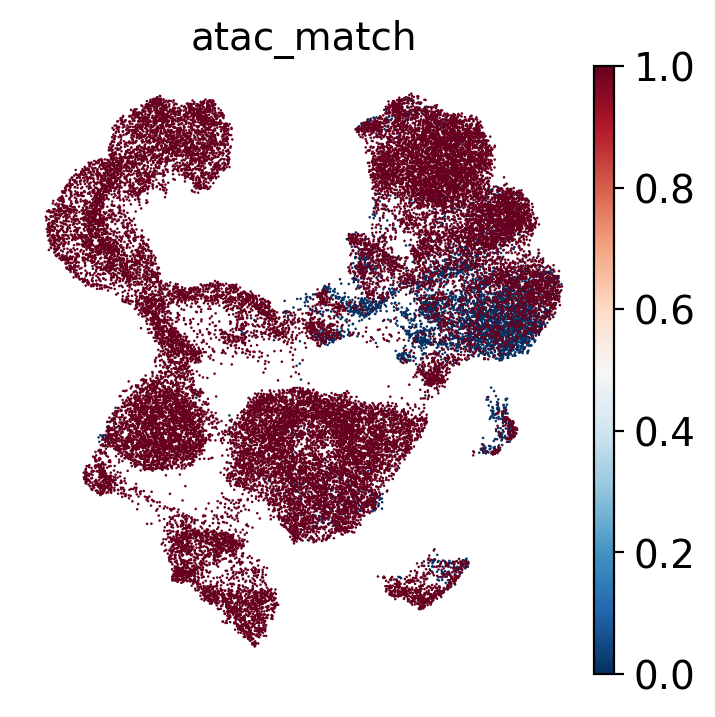

In [13]:
sc.pl.umap(adata, color='atac_match', save='all_cells_atac_match.pdf')

## Clustering

First step, cluster at several resolutions and select the resolution that broadly captures the structure you see in the UMAP. Try to avoid getting into detailed substructure already at this early stage.

In [31]:
sc.tl.leiden(adata, resolution=0.3, key_added='leiden_res0.3')
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_res0.5')
sc.tl.leiden(adata, resolution=0.8, key_added='leiden_res0.8')
sc.tl.leiden(adata, resolution=1, key_added='leiden_res1')

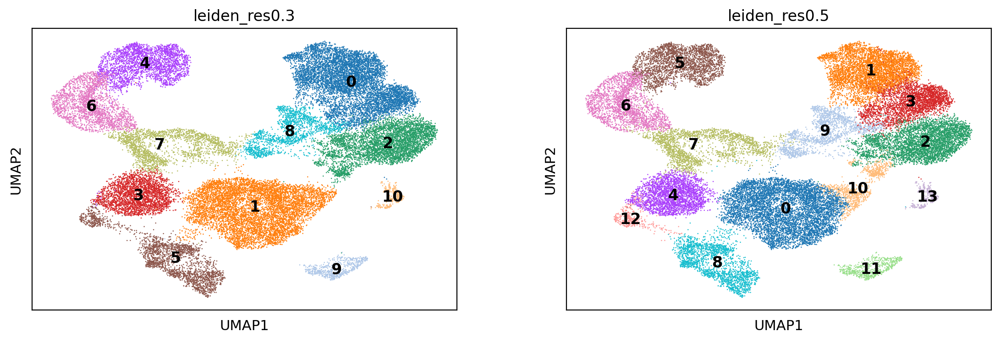

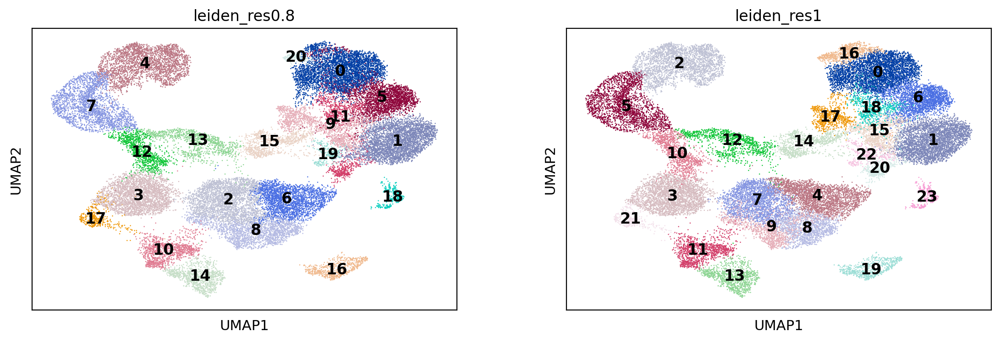

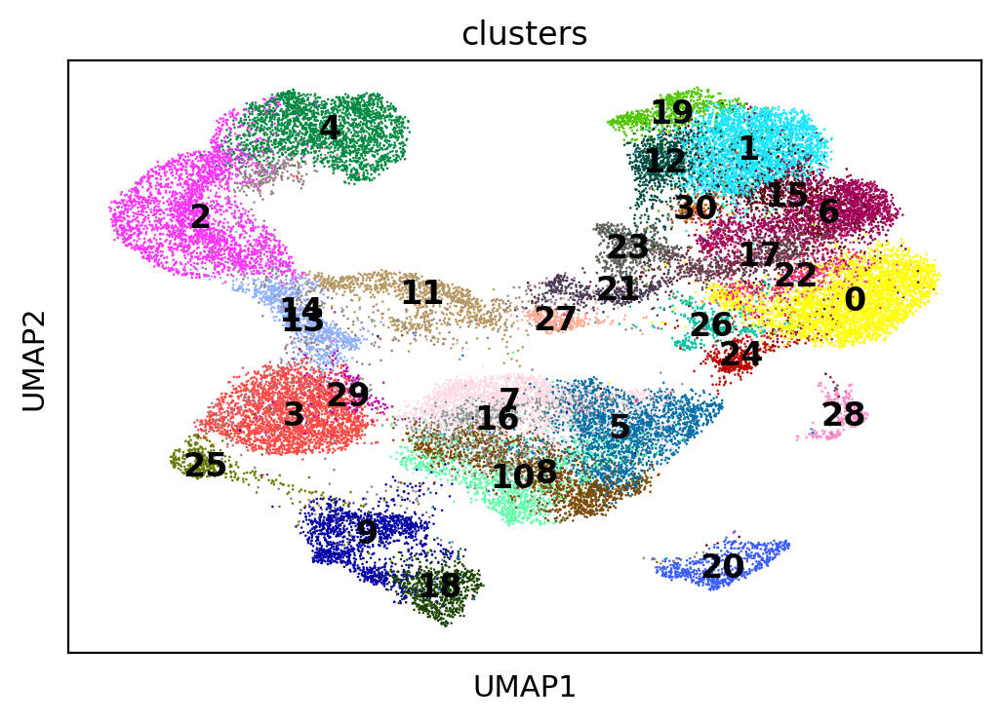

In [32]:
sc.pl.umap(adata, color=['leiden_res0.3', 'leiden_res0.5'], legend_loc='on data')
sc.pl.umap(adata, color=['leiden_res0.8', 'leiden_res1'], legend_loc='on data')
sc.pl.umap(adata, color=['clusters'], legend_loc='on data')

## Marker genes

In [14]:
marker_genes  = {
    "Cardiac mesoderm": ["MESP1", "PDGFRA", "BMP4","EOMES" ],
    "FHF":["TBX5", "SFRP5"],
    "vCM":["NKX2-5", "TTN", "MYL3", "MYL2","MYH6", "MYH7", "TNNT2"],
    "JCF":["HAND1", "HOXB6", "MAB21L2", "BNC2", "HOXB5","ISL1"],
    "Epicardium":["TCF21", "DCN", "MGP", "BNC1"],
    "EPDCs":["EMILIN1", "C7"],
    "FB/SMC":["DDR2", "COL1A2", "TAGLN","MYH11"],
    "EC":["CDH5", "PLVAP","PECAM1"],
    "Endoderm":["FOXA2", "TTR"],
    "New markers": ["TOP2A", "PLK1", "CDH3", "KRT19", "S100A10", "TNNT1", "WT1", "TBX18", "CFI", "SAT1", "CDH1", "PODXL"]
}

In [15]:
sc.tl.rank_genes_groups(adata, groupby='leiden_res1', key_added='rank_genes_res1', layer='log_counts', method='wilcoxon')

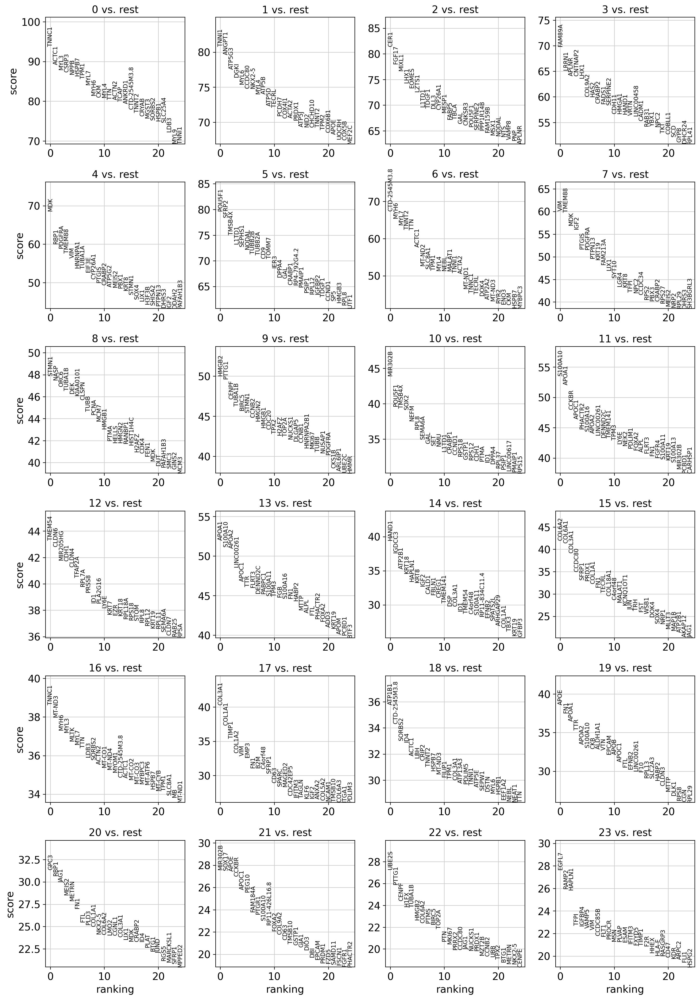

In [24]:
sc.pl.rank_genes_groups(adata, key='rank_genes_res1', n_genes=25, sharey=False)

<AxesSubplot:>

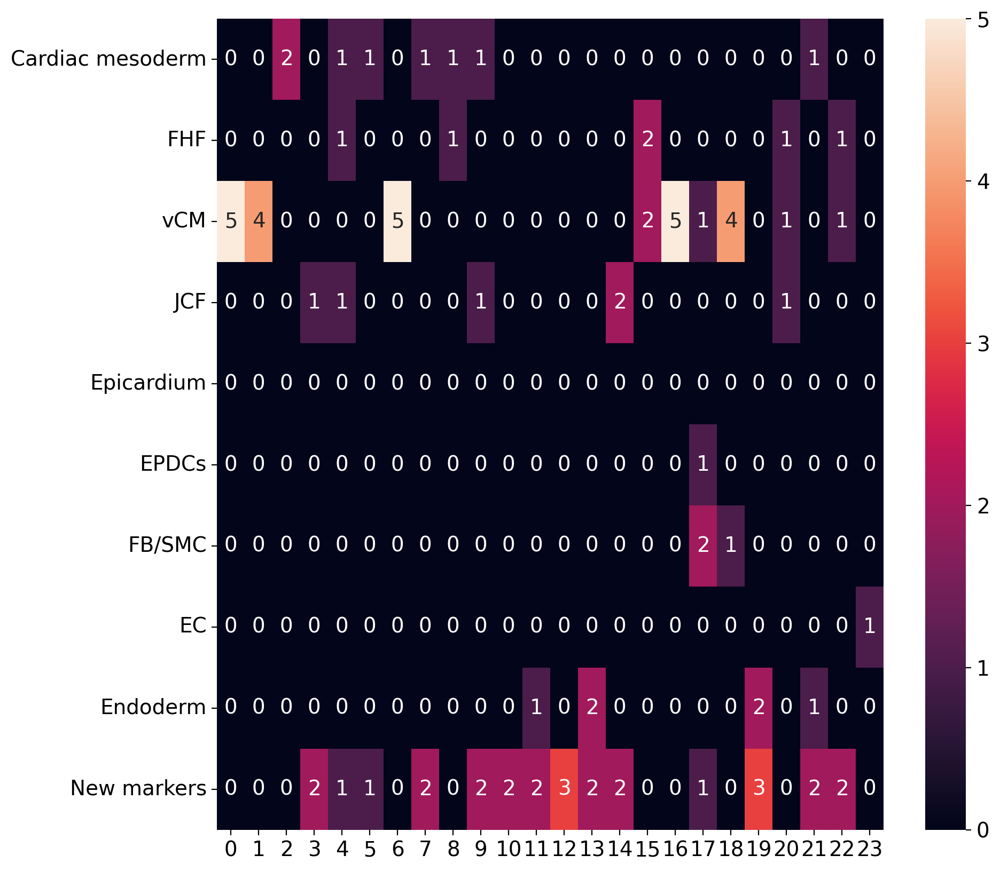

In [17]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(sc.tl.marker_gene_overlap(adata, reference_markers=marker_genes, key='rank_genes_res1'), annot=True)

## Save adata

In [42]:
adata.write('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/metacells.h5ad')

# Plots for publication

## Number of cells with ATAC match

In [13]:
1 - adata.obs['atac_match'].sum()/ adata.shape[0]

0.1369334347446407

In [14]:
1-adata.obs.groupby('day')['atac_match'].mean()

day
2     0.000589
3     0.007998
4     0.014865
5     0.053662
7     0.519489
10    0.243842
15    0.071150
Name: atac_match, dtype: float64

## Number of cells per cluster

In [21]:
n_metacells = adata.obs.leiden_res1.value_counts().to_frame()

In [23]:
n_metacells['n'] = n_metacells['leiden_res1']
n_metacells['leiden_res1'] = n_metacells.index

In [33]:
n_metacells.to_csv(os.path.join(fig_path, 'n_metacells_per_cluster.csv'))

## Heatmap

In [11]:
heatmap_info = pd.read_excel(
    '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/transfer_data/Plots_main_embedding_d2-d15.xlsx',
    sheet_name="Heatmap"
)

In [12]:
#adata.obs['clusters'] = adata.obs['leiden_res1']

In [13]:
cat_order = heatmap_info.dropna().loc[:, 'Cluster order'].astype(int).astype(str).to_list()

In [14]:
adata.obs['leiden_res1'] = adata.obs['leiden_res1'].cat.reorder_categories(cat_order)

In [15]:
adata.uns['leiden_res1_colors'] = adata.uns['leiden_res1_colors'][pd.Series(cat_order).astype(int)]

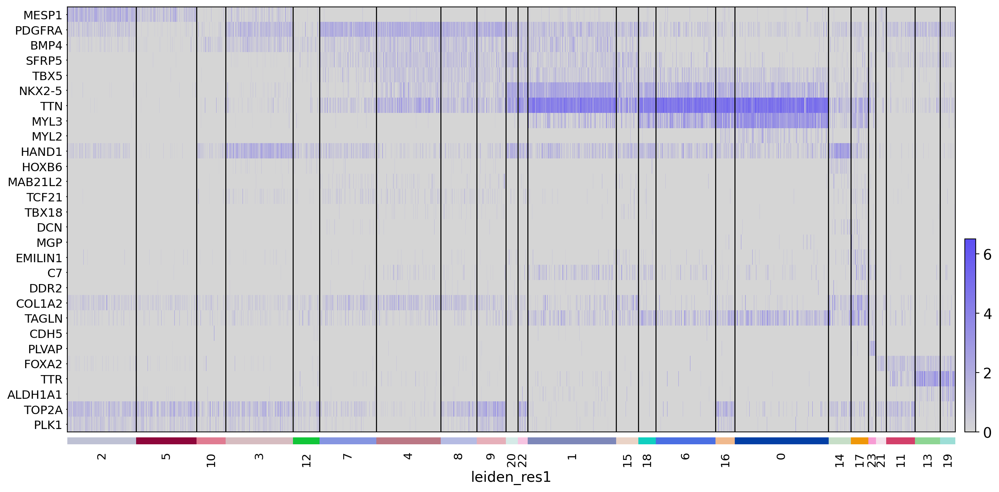

In [36]:
ax = sc.pl.heatmap(
    adata, 
    var_names = heatmap_info.Genes, 
    groupby='leiden_res1', 
    layer='log_counts', 
    swap_axes=True, 
    show=False,
    figsize=(16,8),
    cmap=my_cmap,
    #save='all_markers.pdf'
    #standard_scale='var',
)
ax['groupby_ax'].set_xticklabels(ax['groupby_ax'].get_xticklabels(), rotation=90);
plt.savefig(os.path.join(fig_path, 'heatmap_all_markers.pdf'))

### Plot day labels

In [35]:
from scanpy.pl._anndata import _check_var_names_type, _prepare_dataframe
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import gridspec
import matplotlib as mpl
mpl.rcParams['font.sans-serif'] = ['Arial']


In [27]:
mpl.rcParams['font.family'] = ['sans-serif']

In [50]:
var_names, var_group_labels, var_group_positions = _check_var_names_type(
    heatmap_info.Genes, None, None
)

In [51]:
categories, obs_tidy = _prepare_dataframe(
    adata,
    var_names,
    'leiden_res1',
    False,
    False,
    7,
    gene_symbols=None,
    layer='log_counts',
)

In [52]:
obs_tidy['day'] = adata.obs.day.values

In [53]:
obs_tidy = obs_tidy.sort_index()

In [68]:
label2code = {}  # dictionary of numerical values asigned to each label
for code, (label, value) in enumerate(
    obs_tidy.day.value_counts(sort=False).iteritems()
):
    label2code[label] = code

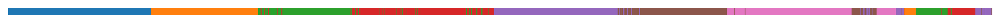

In [83]:
dendro_height = 0
groupby_height = 0.13 
colorbar_width = 0.2
width, height = (16,8)
heatmap_height = height - (dendro_height + groupby_height)

height_ratios = [dendro_height, heatmap_height, groupby_height]
width_ratios = [width, 0, colorbar_width]

fig = pl.figure(figsize=(width, height))
axs = gridspec.GridSpec(
    nrows=3,
    ncols=3,
    wspace=0.25 / width,
    hspace=0.3 / height,
    width_ratios=width_ratios,
    height_ratios=height_ratios,
)
ax = fig.add_subplot(axs[2, 0])

ax.grid(False)
groupby_cmap = ListedColormap(adata.uns['day_colors'], 'day' + '_cmap')
norm = BoundaryNorm(np.arange(groupby_cmap.N + 1) - 0.5, groupby_cmap.N)

ax.imshow(np.array([[label2code[lab] for lab in obs_tidy.day]]), aspect='auto', norm=norm, cmap=groupby_cmap)
# remove x ticks
ax.tick_params(axis='x', bottom=False, labelbottom=False)
# remove y ticks and labels
ax.tick_params(axis='y', left=False, labelleft=False)

# remove surrounding lines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

plt.savefig(os.path.join(fig_path, 'day_color_bar.pdf'))

## Violin Plot

In [67]:
violin_info = pd.read_excel(
    '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/transfer_data/Plots_main_embedding_d2-d15.xlsx',
    sheet_name="Violin"
)

In [68]:
violin_info.head()

,Cluster order,Genes,Unnamed: 2,Cluster order.1,Genes.1
0,7.0,ISL1,NaN,20,ISL1
1,8.0,NKX2-5,NaN,22,TNNT2
2,4.0,NaN,NaN,1,NaN
3,9.0,NaN,NaN,15,NaN
4,12.0,NaN,NaN,18,NaN


In [77]:
clusters = violin_info['Cluster order'].dropna().astype(int).astype(str)

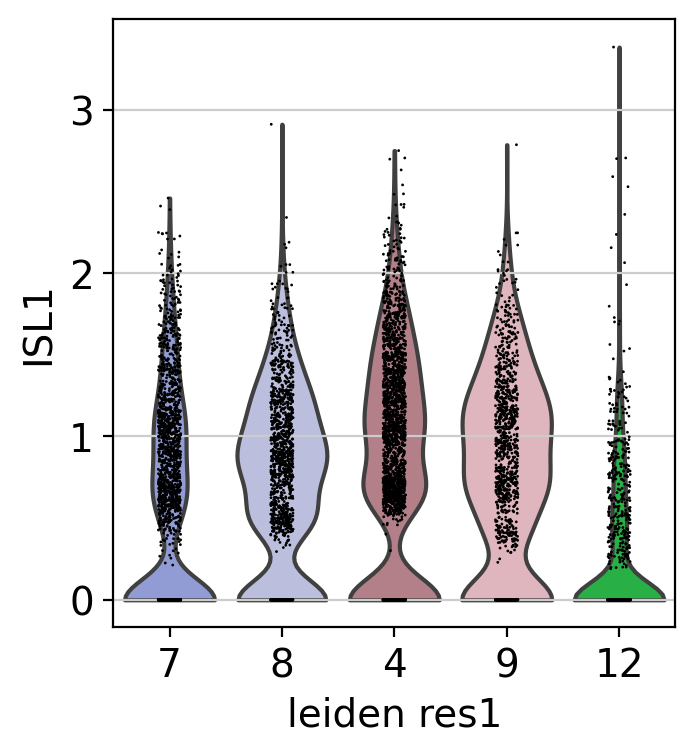

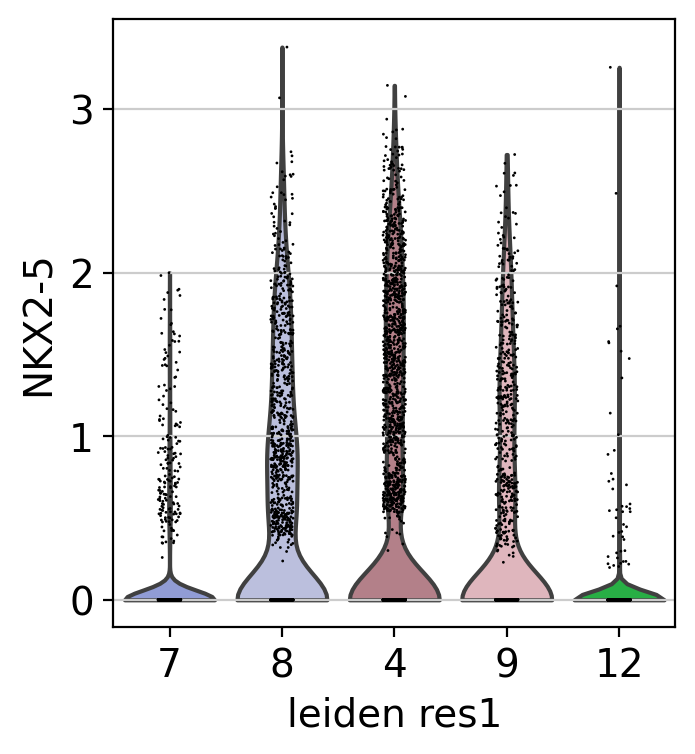

In [78]:
for gene in violin_info.Genes.dropna():
    sc.pl.violin(adata[adata.obs.leiden_res1.isin(clusters)], 
                 keys=gene, 
                 groupby='leiden_res1', 
                 layer='log_counts',
                 order=clusters_1,
                 save=gene + '_'.join(clusters)
                )

In [80]:
clusters = violin_info['Cluster order.1'].dropna().astype(int).astype(str)

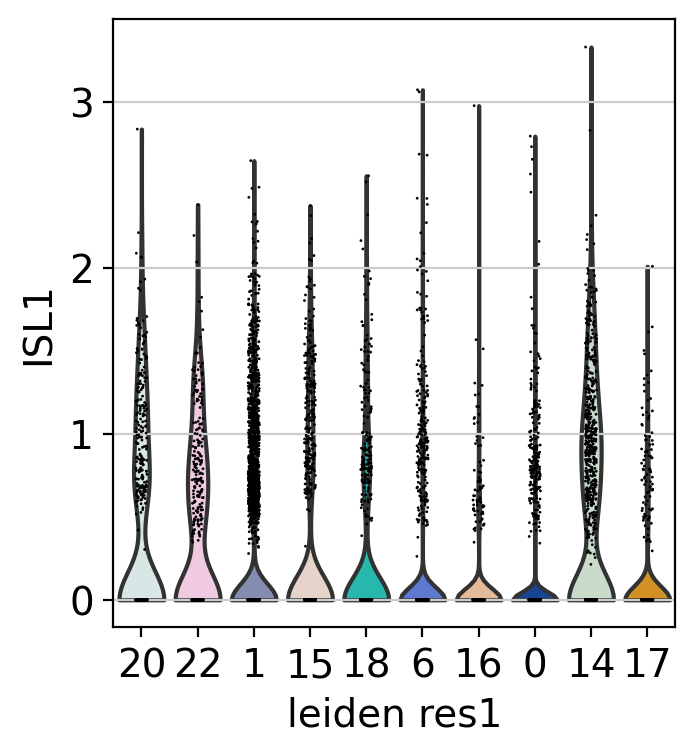

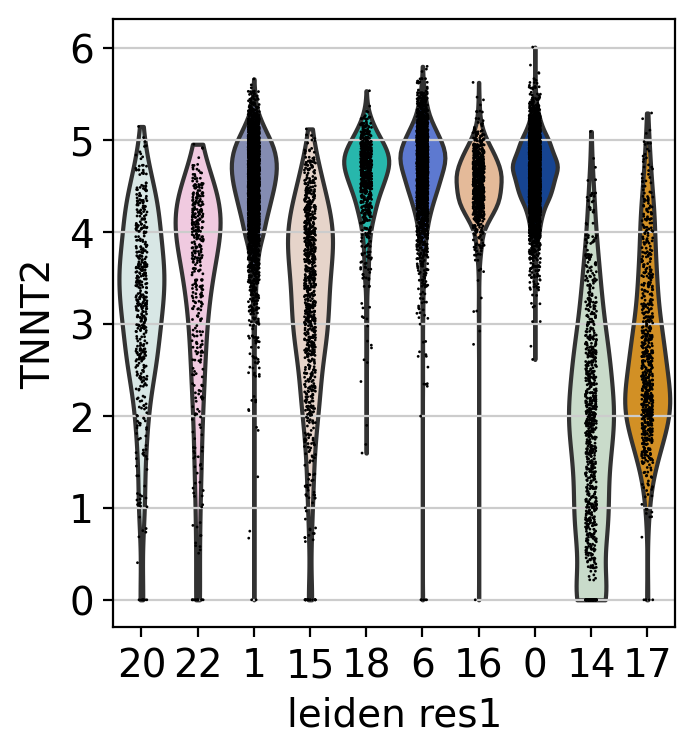

In [81]:
for gene in violin_info['Genes.1'].dropna():
    sc.pl.violin(adata[adata.obs.leiden_res1.isin(clusters)], 
                 keys=gene, 
                 groupby='leiden_res1', 
                 layer='log_counts',
                 order=clusters,
                 save=gene + '_'.join(clusters)
                )

In [152]:
violin_info = pd.read_excel(
    '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/transfer_data/Plots_main_embedding_d2-d15_2.xlsx',
    sheet_name="Violin"
)

In [154]:
clusters = violin_info['Cluster order'].dropna().astype(int).astype(str)

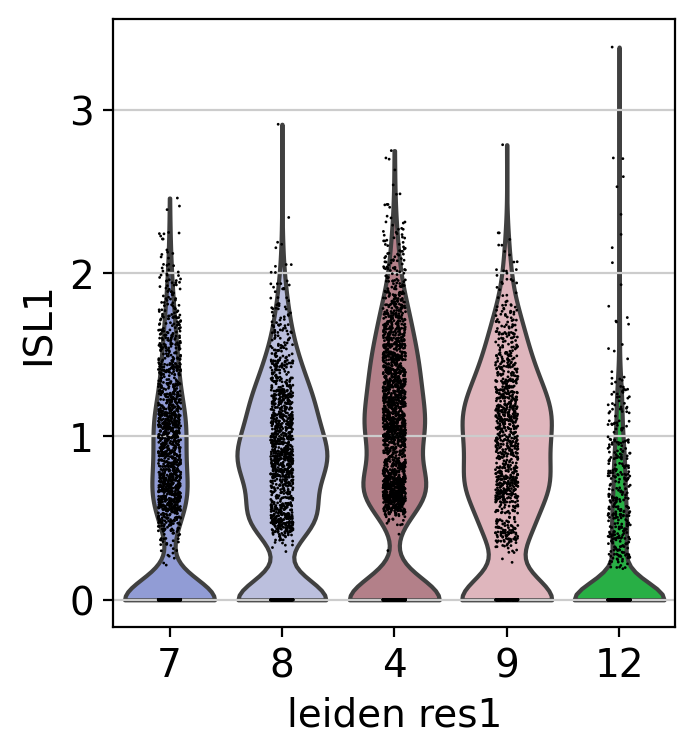

In [155]:
for gene in violin_info.Genes.dropna():
    sc.pl.violin(adata[adata.obs.leiden_res1.isin(clusters)], 
                 keys=gene, 
                 groupby='leiden_res1', 
                 layer='log_counts',
                 order=clusters,
                 save=gene + '_'.join(clusters)
                )

In [156]:
clusters = violin_info['Cluster order.1'].dropna().astype(int).astype(str)

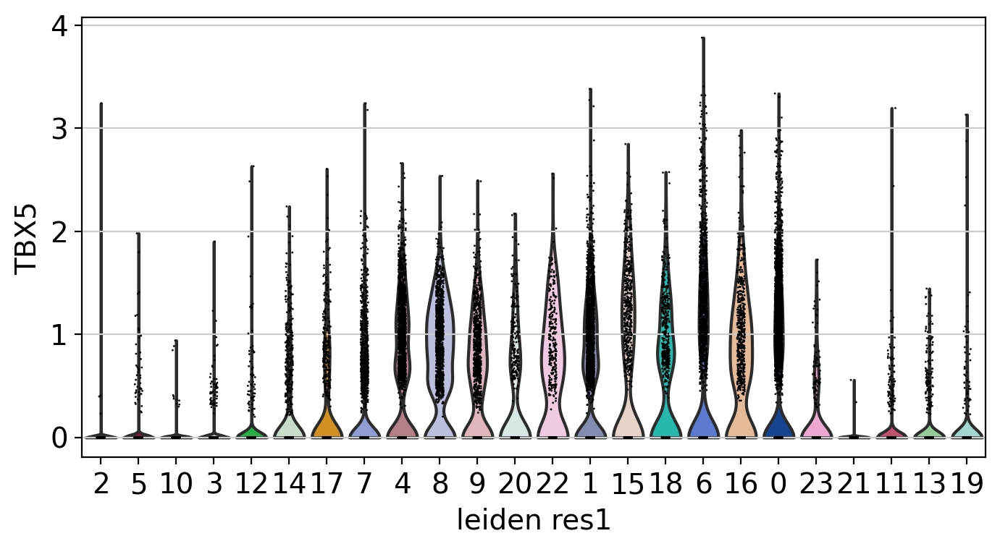

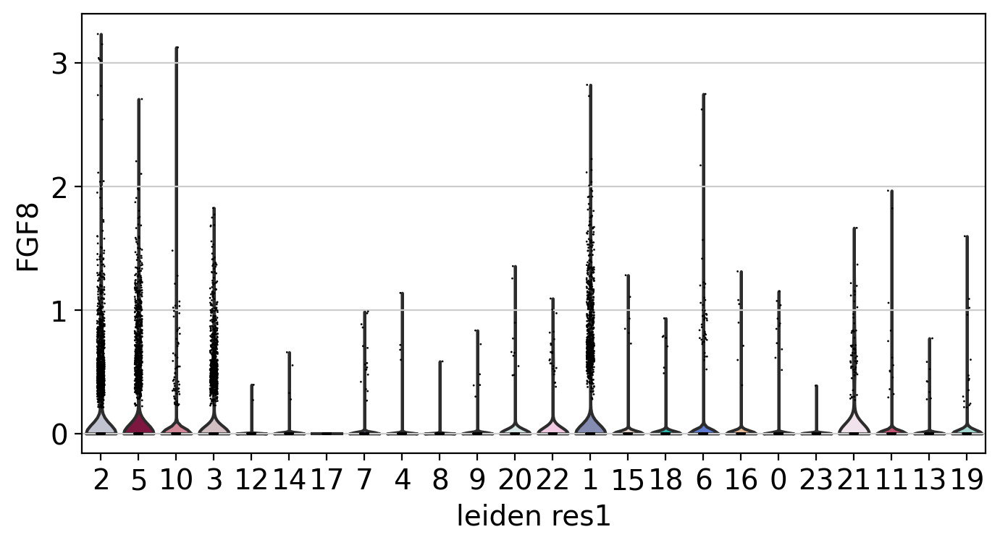

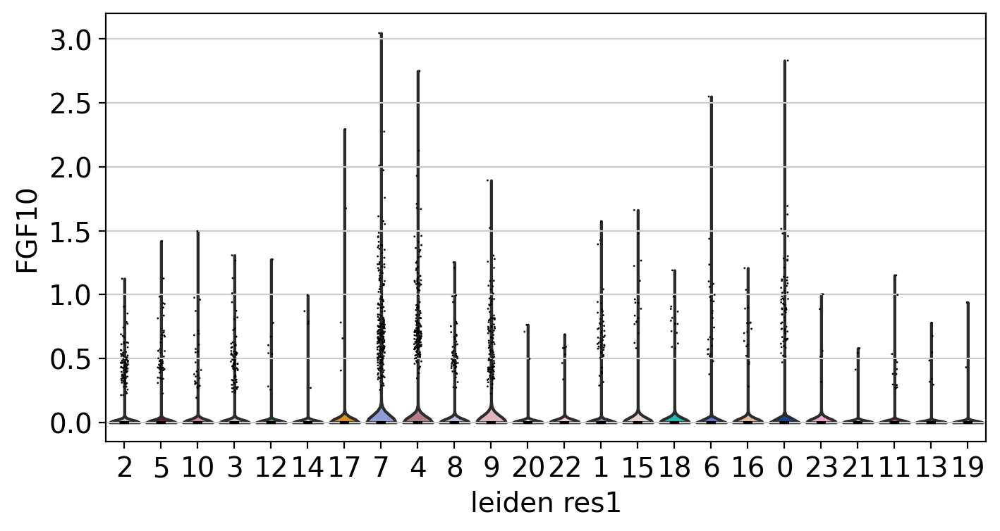

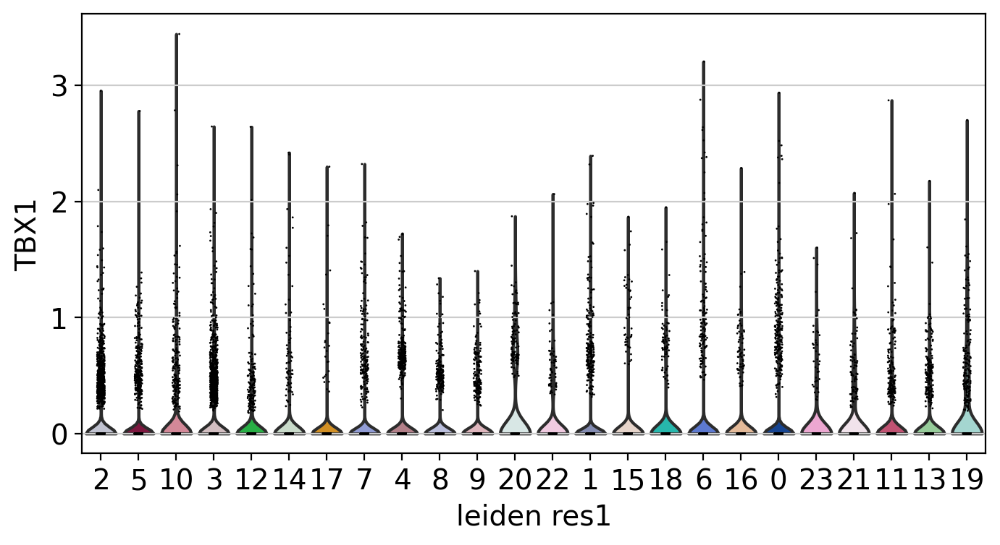

In [157]:
for gene in violin_info['Genes.1'].dropna():
    fig, ax = plt.subplots(figsize=(8,4))
    sc.pl.violin(adata[adata.obs.leiden_res1.isin(clusters)], 
                 keys=gene, 
                 groupby='leiden_res1', 
                 layer='log_counts',
                 order=clusters,
                 save=gene + '_'.join(clusters), 
                 ax=ax
                )

## Feature plots

In [11]:
feature_info = pd.read_excel(
    '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/transfer_data/Plots_main_embedding_d2-d15.xlsx',
    sheet_name="Feature", header=None, names=['Genes']
)

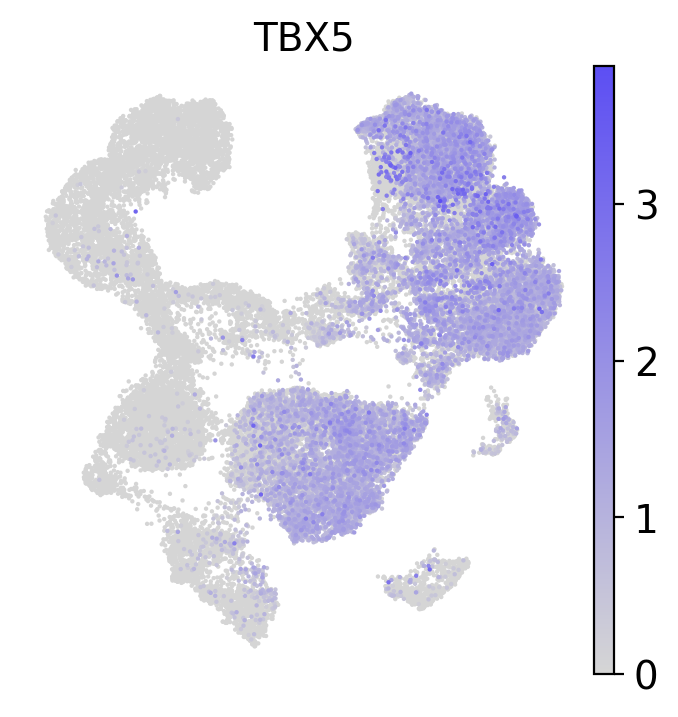

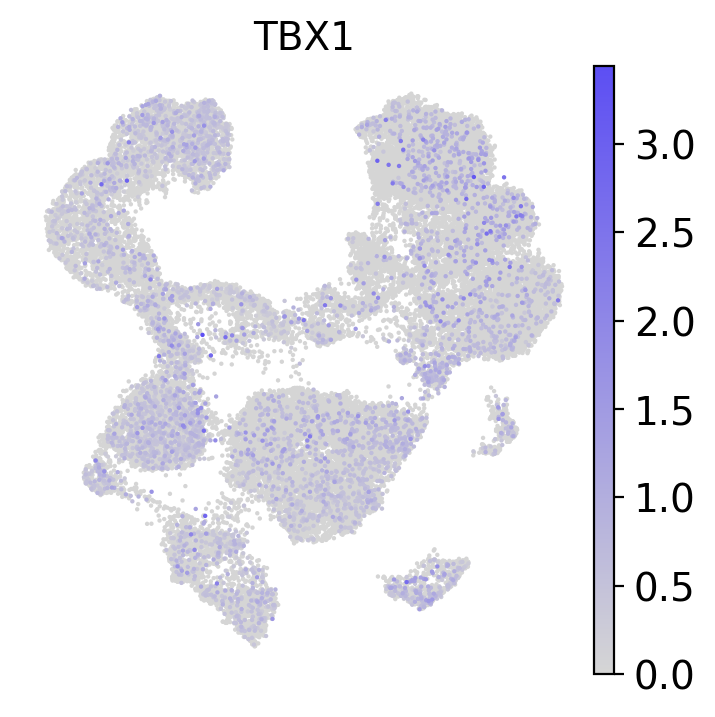

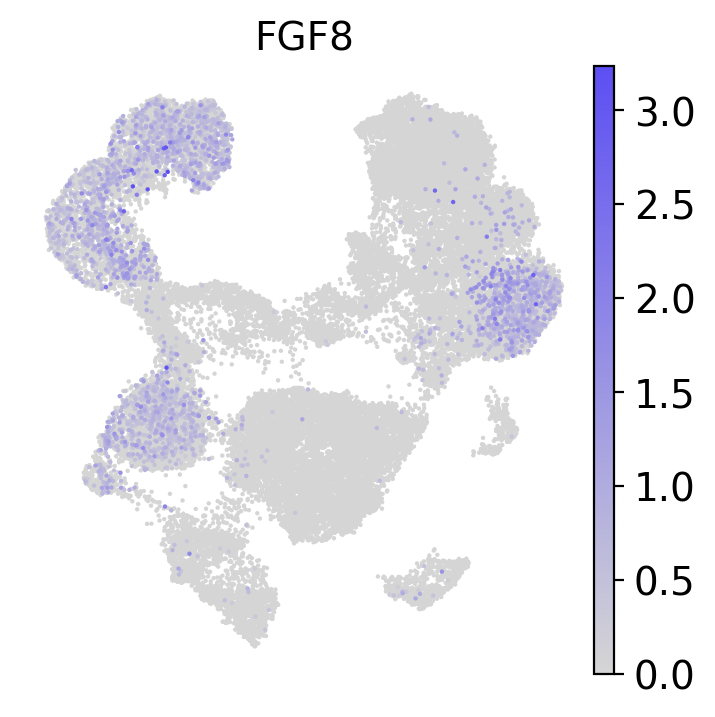

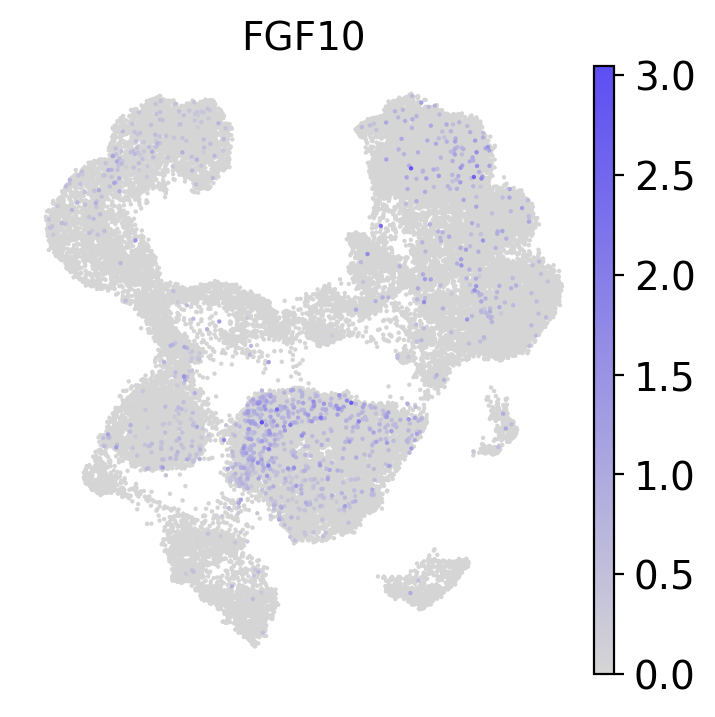

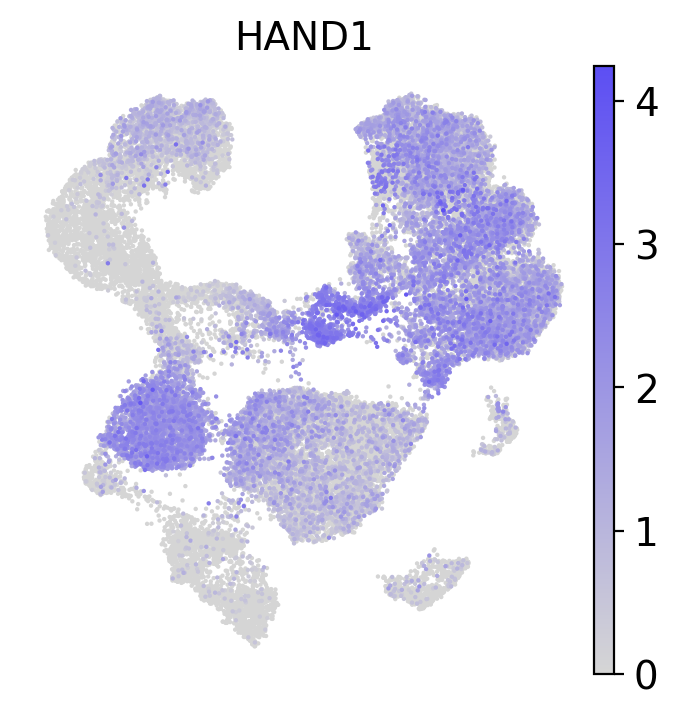

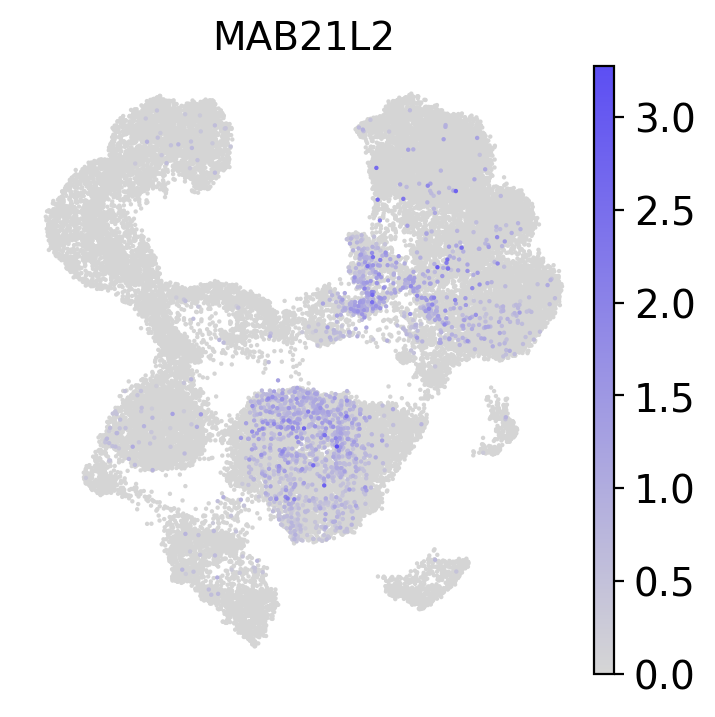

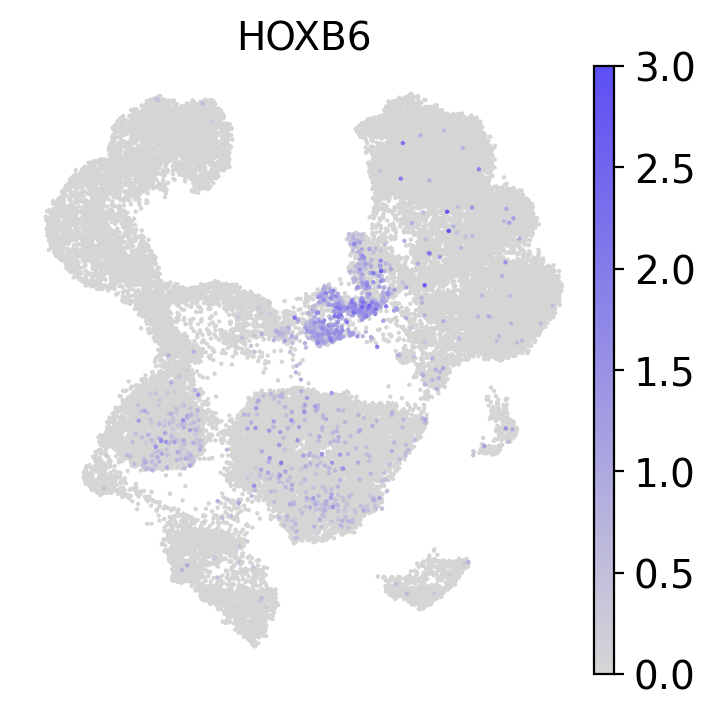

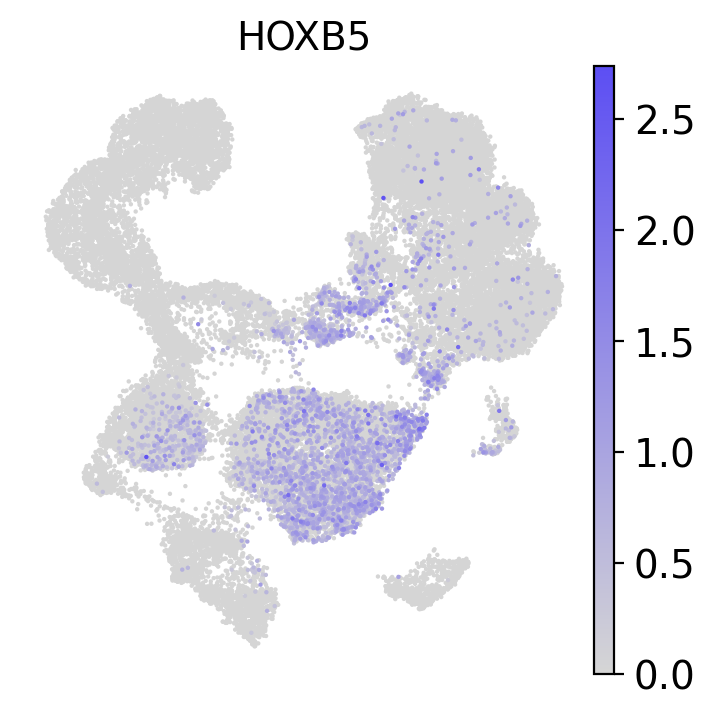

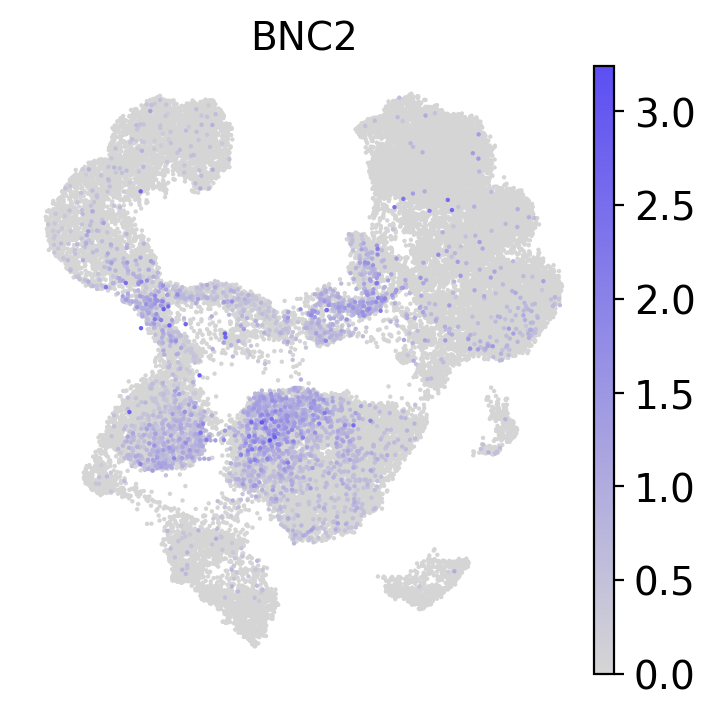

In [91]:
for gene in feature_info['Genes']:
    sc.pl.umap(adata, color=gene, layer='log_counts', save=gene, cmap=my_cmap, size=10)

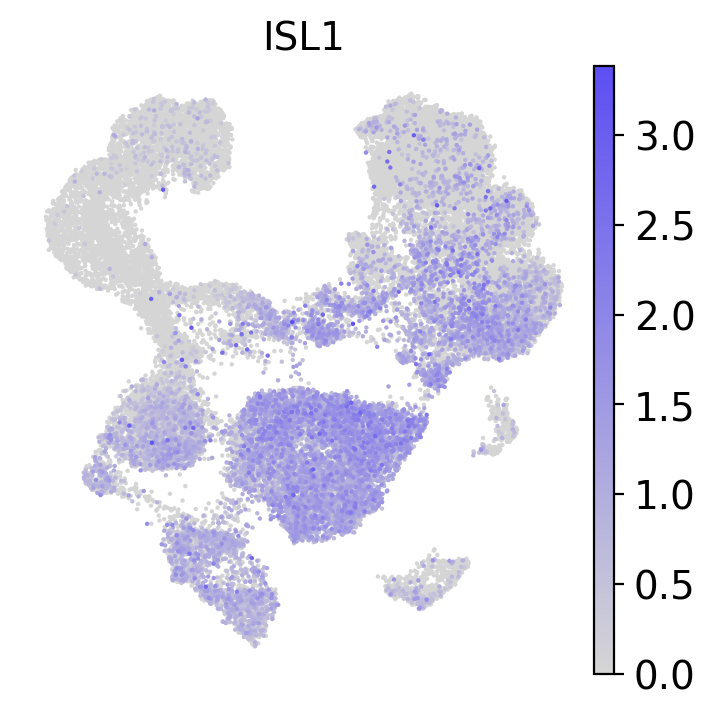

In [14]:
sc.pl.umap(adata, color="ISL1", layer='log_counts', save="ISL1", cmap=my_cmap, size=10)

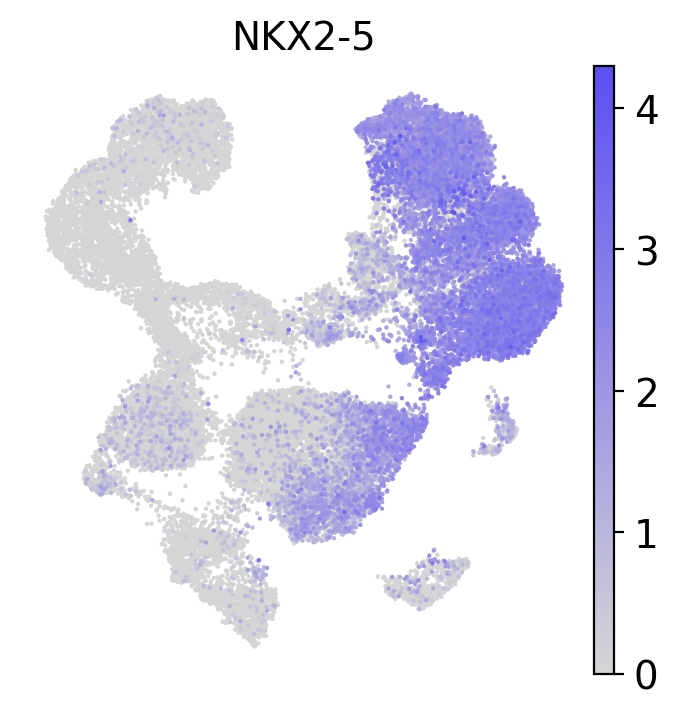

In [13]:
sc.pl.umap(adata, color="NKX2-5", layer='log_counts', save="NKX2-5", cmap=my_cmap, size=10)

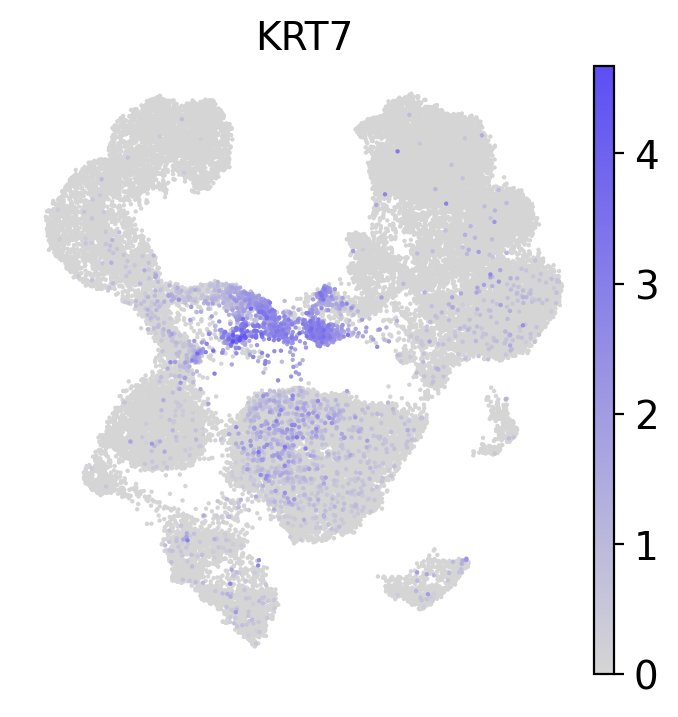

In [14]:
sc.pl.umap(adata, color="KRT7", layer='log_counts', save="KRT7", cmap=my_cmap, size=10)

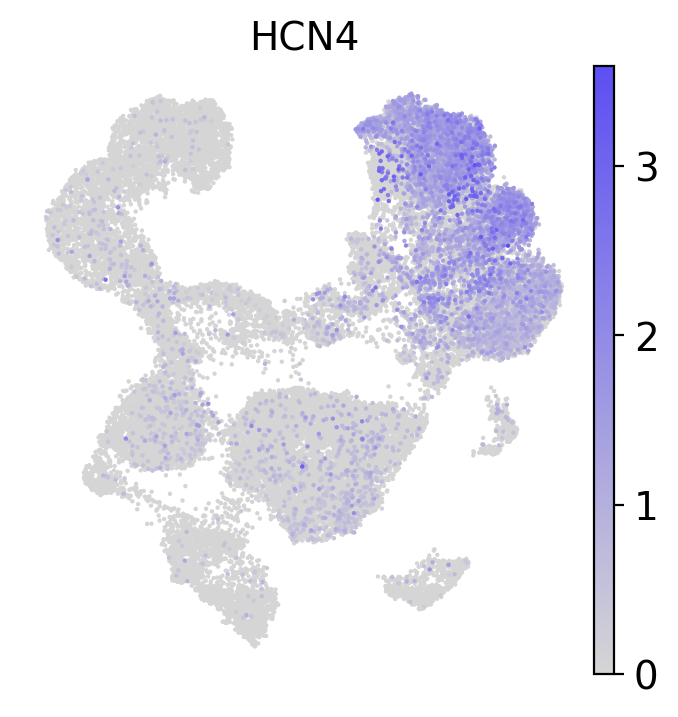

In [13]:
sc.pl.umap(adata, color="HCN4", layer='log_counts', save="HCN4", cmap=my_cmap, size=10)

### Plot gene activity

In [92]:
adata_act = get_act(adata)

In [93]:
adata_act[adata_act.obs['atac_match']==0].X = np.nan

In [94]:
adata_act[adata_act.obs['atac_match']==0].X.data

array([nan, nan, nan, ..., nan, nan, nan], dtype=float32)

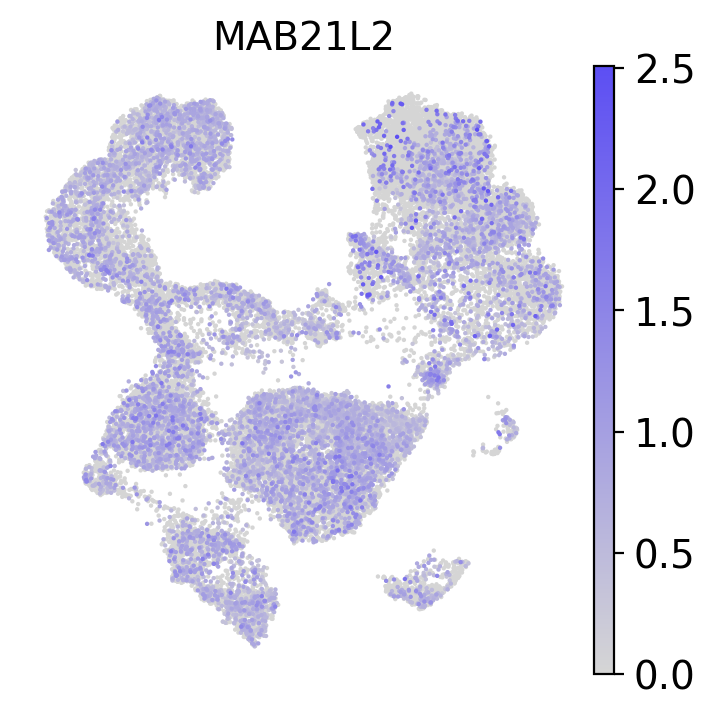

In [111]:
sc.pl.umap(adata_act, color="MAB21L2", save='_activity_MAB21L2', cmap=my_cmap, size=10, na_color='white')

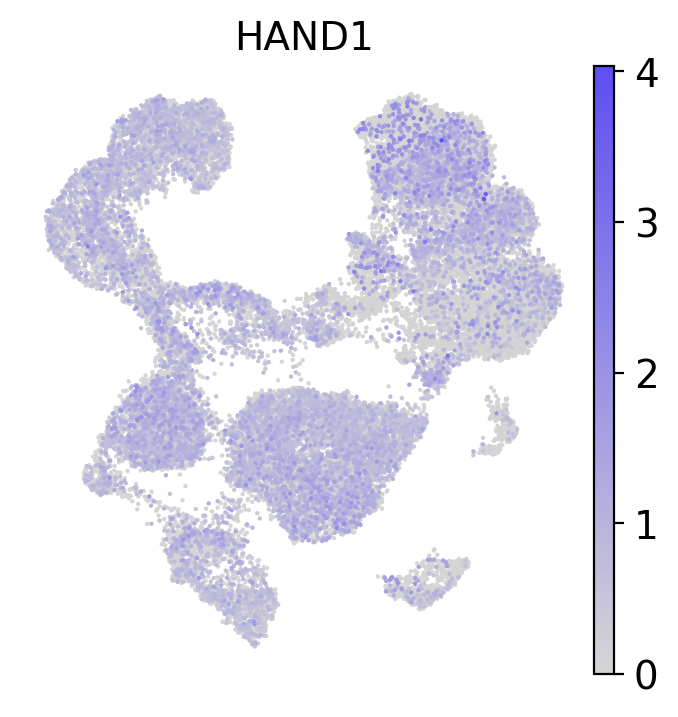

In [112]:
sc.pl.umap(adata_act, color="HAND1", save='_activity_HAND1', cmap=my_cmap, size=10)

## Plot signature

In [113]:
signature_info = pd.read_excel(
    '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/transfer_data/Plots_main_embedding_d2-d15.xlsx',
    sheet_name="Co-expression"
)

In [114]:
adata.obs['JCF signature'] = adata[:, signature_info['JCF signature']].layers['log_counts'].A.sum(axis=1)

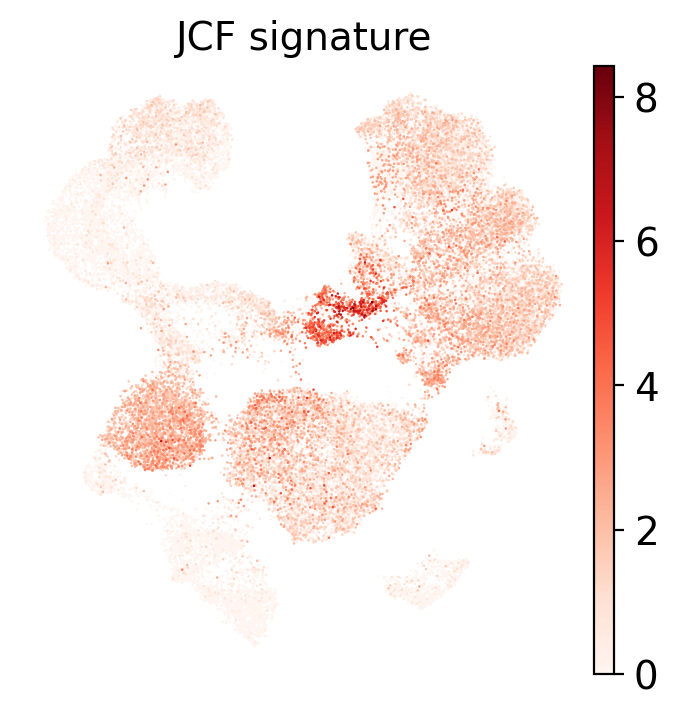

In [115]:
sc.pl.umap(adata, color='JCF signature', cmap='Reds', save='JCF signature')

## DEG tables for all clusters

In [26]:
adata.uns['rank_genes_res1'].pop('params')

{'groupby': 'leiden_res1',
 'reference': 'rest',
 'method': 'wilcoxon',
 'use_raw': False,
 'layer': 'log_counts',
 'corr_method': 'benjamini-hochberg'}

In [27]:
for cluster in adata.obs.leiden_res1.unique():
    df = pd.DataFrame({key: item[cluster] for key, item in adata.uns['rank_genes_res1'].items()}).head(100)
    df.to_csv(os.path.join(fig_path, f'top_100_deg_cluster_{cluster}.csv'))

In [135]:
# deg_all_list = []
# fields = ['names', 'logfoldchanges', 'pvals_adj']
# for cell_type in adata.obs.leiden_res1.unique():
#     deg
    # deg = pd.DataFrame({field: adata.uns['rank_genes_res1'][field][cell_type] for field in fields})
    # deg_all = deg[(np.abs(deg.logfoldchanges) >= 1.5) & (deg.pvals_adj < 0.05)]
    # deg_all.to_csv(os.path.join(fig_path, f'deg_cluster_{cell_type}.csv'))
    # deg_all_list.append(deg_all)

## Plot absorption probabilities

In [138]:
from cellrank.tl.estimators import GPCCA
g = GPCCA.read(os.path.join(data_path, 'cellrank', 'g.pickle'))

In [140]:
g.compute_absorption_probabilities(solver='gmres', use_petsc=True)

  0%|          | 0/5 [00:00<?, ?/s]

In [143]:
for state in g.terminal_states.cat.categories:
    g.adata.obs[state] = g.adata.obsm['to_terminal_states'][state].X

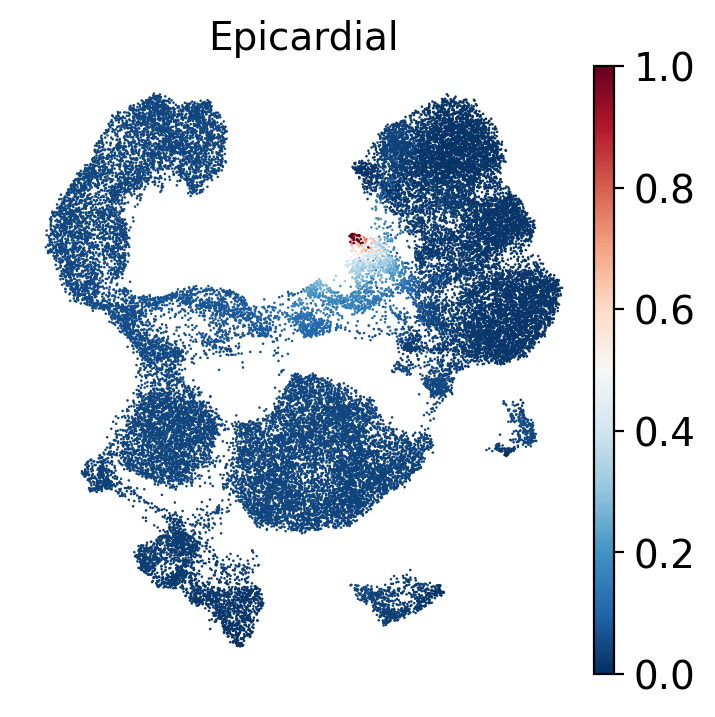

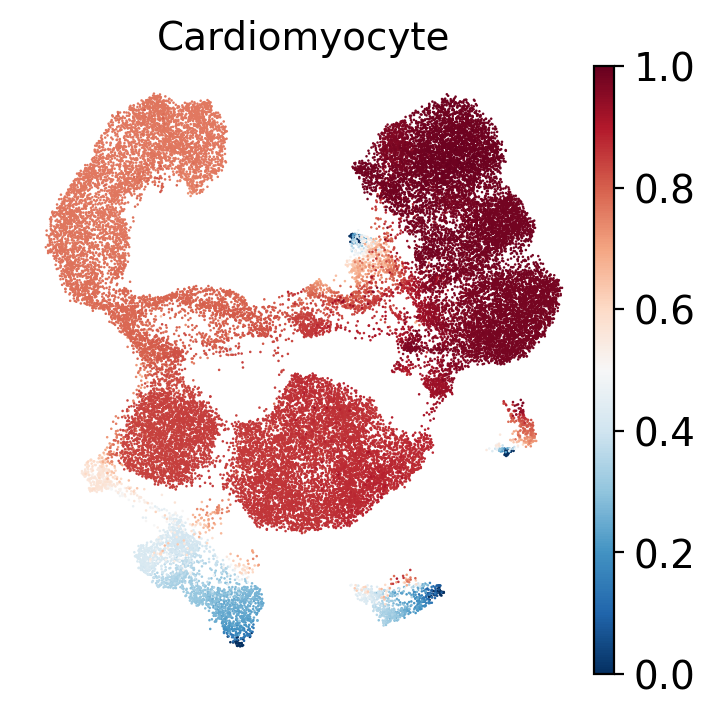

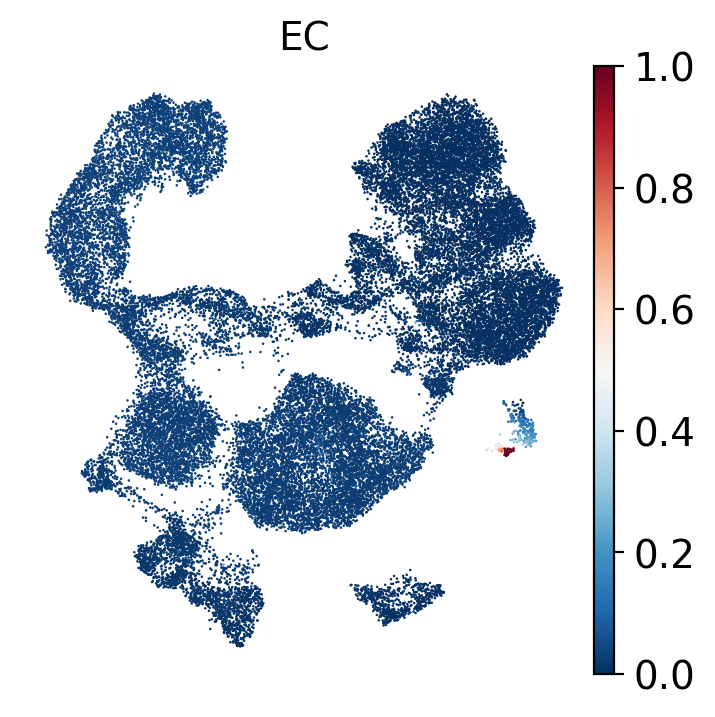

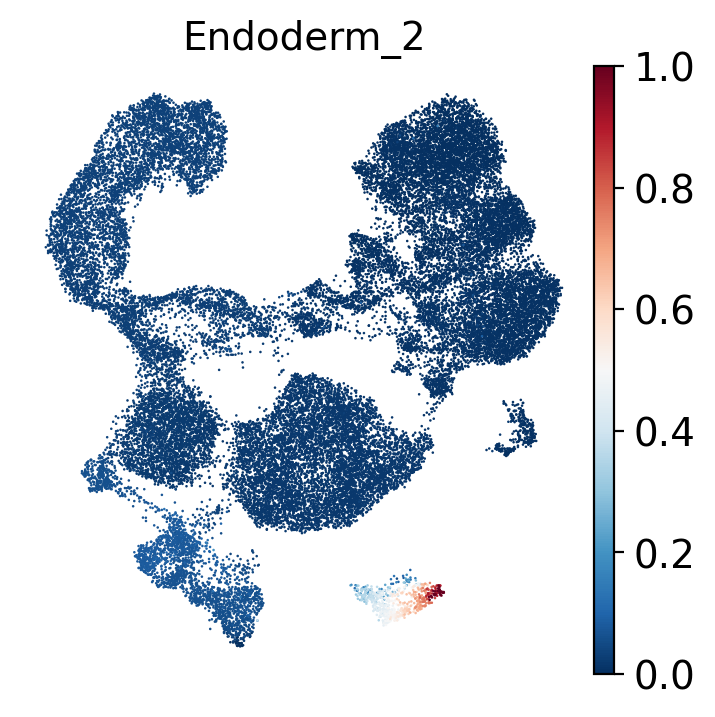

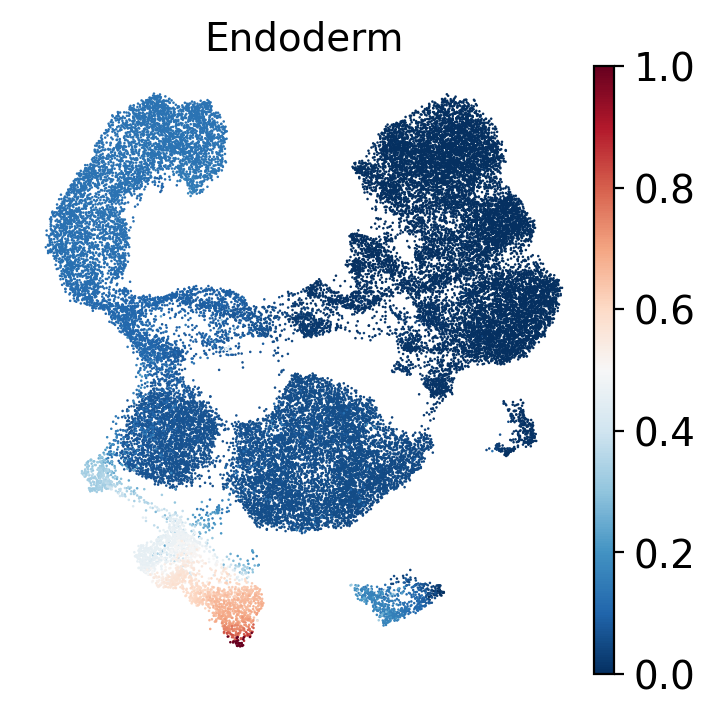

In [146]:
for state in g.terminal_states.cat.categories:
    sc.pl.umap(g.adata, color=[state], save=f'ap_{state}.pdf')

## Violin plots of absorption probability

In [158]:
violin_info = pd.read_excel(
    '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/transfer_data/Plots_main_embedding_d2-d15_2.xlsx',
    sheet_name="Absorption probabilities violin"
)

In [159]:
clusters = violin_info['Cluster order'].dropna().astype(int).astype(str)

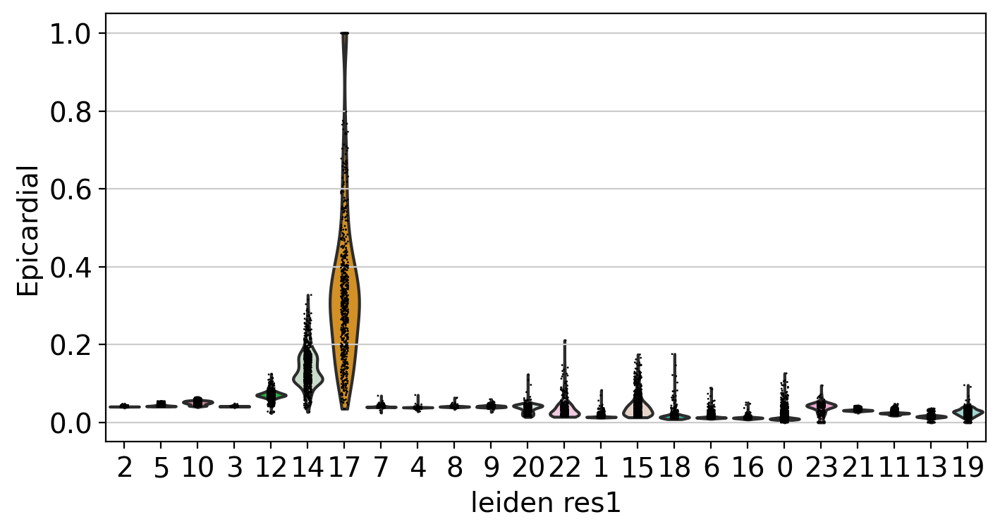

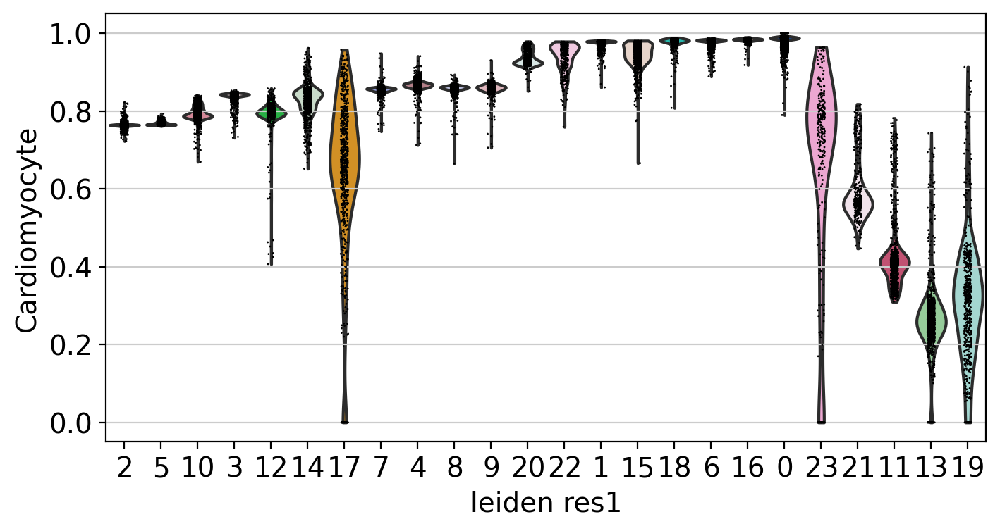

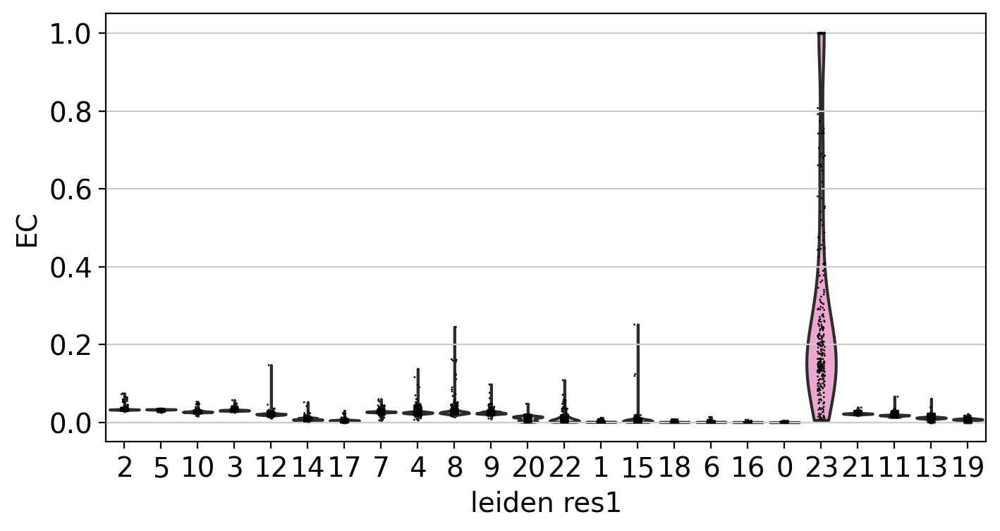

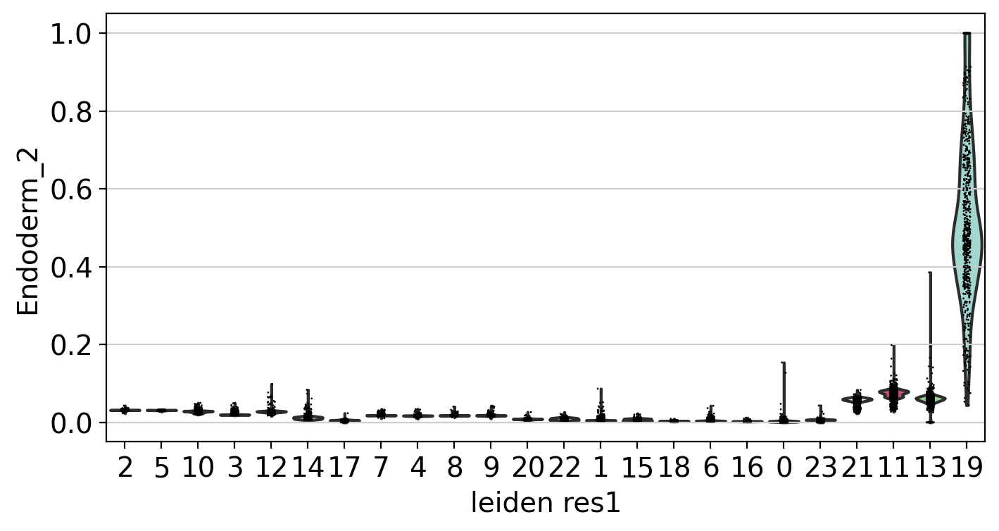

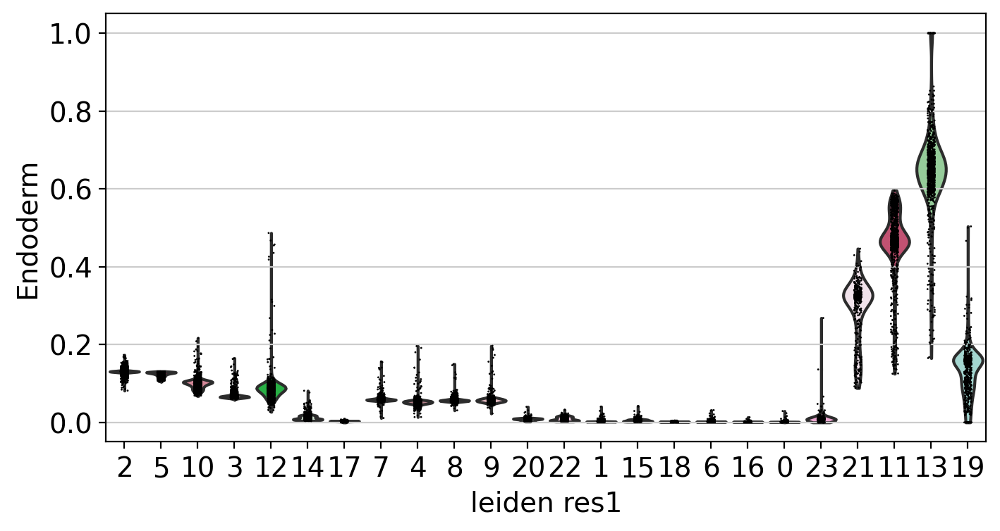

In [161]:
for state in g.terminal_states.cat.categories:
    fig, ax = plt.subplots(figsize=(8,4))
    sc.pl.violin(g.adata[g.adata.obs.leiden_res1.isin(clusters)], 
                 keys=state, 
                 groupby='leiden_res1', 
                 order=clusters,
                 save=state + '_'.join(clusters), 
                 ax=ax
                )

# Save adata in R

In [9]:
import scanpy as sc
import anndata as ad
import scipy.io
import pandas as pd

In [2]:
adata = sc.read('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/metacells.h5ad')

In [3]:
## only rna
obs = adata.obs.loc[:, ['clusters', 'leiden_res1', 'day']]
var = adata.var.loc[:, ['gene']]
rna_only = ad.AnnData(X=adata.layers["log_counts"], obs=obs, var=var)
rna_only.obsm['X_umap'] = adata.obsm['X_umap']

In [4]:
rna_only.write('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only.h5ad')

In [5]:
# save data in table
scipy.io.mmwrite('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only.mtx', rna_only.X)

In [6]:
rna_only.obs.to_csv('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only_obs.csv', sep='\t')

In [7]:
rna_only.var.to_csv('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only_var.csv', sep='\t')

In [10]:
#embedding
embedding = pd.DataFrame(rna_only.obsm['X_umap'], columns=['UMAP_1', "UMAP_2"])

In [11]:
embedding.to_csv('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only_emebdding.csv', sep='\t')

# with R kernel convert to Seurat

In [1]:
library(Matrix)
library(Seurat)
library(data.table)

Attaching SeuratObject

Attaching sp



In [2]:
matrix <- readMM("/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only.mtx")

In [3]:
obs <- fread('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only_obs.csv')
rownames(obs) <- obs$V1
obs$V1 <- NULL

In [4]:
var <- fread('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only_var.csv', header = TRUE)
rownames(var) <- var$V1
var$V1 <- NULL

In [5]:
rownames(matrix) <- rownames(obs)
colnames(matrix) <- rownames(var)

In [6]:
embedding <- fread('/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only_emebdding.csv')
embedding$V1 <- NULL

In [7]:
embedding <- as.matrix(embedding)
rownames(embedding) <- rownames(obs)
umap <-  CreateDimReducObject(embedding)

Warning message:
“No assay specified, setting assay as RNA by default.”


In [8]:
rna <- CreateSeuratObject(counts = t(matrix), project = "epicardiods", assay = "RNA", meta.data=obs)

In [9]:
rna@reductions$umap <- umap

In [12]:
saveRDS(rna, '/lustre/groups/ml01/workspace/laura.martens/moretti_colab/scglue/rna_only.rds')

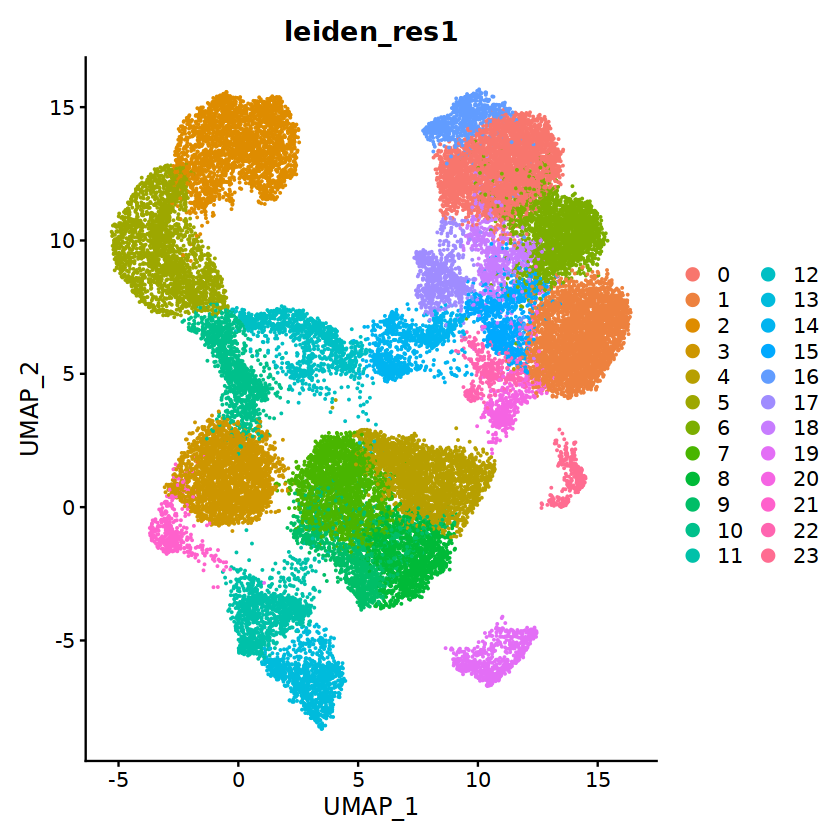

In [11]:
DimPlot(rna, group.by = 'leiden_res1')